In [ ]:
!pip install mxnet-cu100

     |████████████████████████████████| 827.8MB 13kB/s 
  Found existing installation: graphviz 0.10.1
    Uninstalling graphviz-0.10.1:
      Successfully uninstalled graphviz-0.10.1


In [ ]:
import mxnet as mx
from mxnet import nd ,gluon, autograd,gpu
from google.colab import drive
import glob
import numpy as np
import os
from google.colab import drive
from PIL import Image
from scipy import signal
from matplotlib import pyplot as plt

In [ ]:

DRIVE_MOUNT='/content/gdrive'
drive.mount(DRIVE_MOUNT)


Mounted at /content/gdrive


In [ ]:
UCSD_FOLDER=os.path.join(DRIVE_MOUNT, 'My Drive', 'UCSD_Anomaly_Dataset.v1p2')
train_files = sorted(glob.glob(UCSD_FOLDER+ '/UCSDped1/Train/*/*'))
train_images = np.zeros((len(train_files),1,100,100))
for idx, filename in enumerate(train_files):
    im = Image.open(filename)
    im = im.resize((100,100))
    train_images[idx,0,:,:] = np.array(im, dtype=np.float32)/255.0
np.save(UCSD_FOLDER+ '/UCSD_Anomaly_Dataset.v1p2.npy',train_images)

In [ ]:

class ConvolutionalAutoencoder(gluon.nn.HybridBlock):
    
    def __init__(self):
        super(ConvolutionalAutoencoder, self).__init__()
        
        with self.name_scope():
            self.encoder = gluon.nn.HybridSequential()
            with self.encoder.name_scope():
                self.encoder.add(gluon.nn.Conv2D(32, 5, activation='relu'))
                self.encoder.add(gluon.nn.MaxPool2D(2))
                self.encoder.add(gluon.nn.Conv2D(32, 5, activation='relu'))
                self.encoder.add(gluon.nn.MaxPool2D(2))
                self.encoder.add(gluon.nn.Dense(2000))

            self.decoder = gluon.nn.HybridSequential()
            with self.decoder.name_scope():
                self.decoder.add(gluon.nn.Dense(32*22*22, activation='relu'))
                self.decoder.add(gluon.nn.HybridLambda(lambda F, x: F.UpSampling(x, scale=2, sample_type='nearest')))
                self.decoder.add(gluon.nn.Conv2DTranspose(32, 5, activation='relu'))
                self.decoder.add(gluon.nn.HybridLambda(lambda F, x: F.UpSampling(x, scale=2, sample_type='nearest')))
                self.decoder.add(gluon.nn.Conv2DTranspose(1, kernel_size=5, activation='sigmoid'))

    def hybrid_forward(self, F, x):
        x = self.encoder(x)
        x = self.decoder[0](x)
        x = x.reshape((-1,32,22,22))
#         print(self.decoder)
        x = self.decoder[1](x)
        x = self.decoder[2](x)
        x = self.decoder[3](x)
        x = self.decoder[4](x)
        return x

In [ ]:
import tensorflow as tf
tf.test.gpu_device_name()

'/device:GPU:0'

In [ ]:
im_train = np.load(UCSD_FOLDER+ '/UCSD_Anomaly_Dataset.v1p2.npy')
batch_size= 32
dataset = gluon.data.ArrayDataset(mx.nd.array(im_train, dtype=np.float32))
dataloader = gluon.data.DataLoader(dataset, batch_size=batch_size, last_batch='rollover',shuffle=True)
ctx = gpu()
num_epochs = 50
model = ConvolutionalAutoencoder()
model.hybridize()
model.collect_params().initialize(mx.init.Xavier('gaussian'), ctx=ctx)
loss_function = gluon.loss.L2Loss()
optimizer = gluon.Trainer(model.collect_params(), 'adam', {'learning_rate': 1e-4, 'wd': 1e-5})

In [ ]:
## Training Loop ##
loss_train=[]
for epoch in range(num_epochs):
    for image_batch in dataloader:   
        image = image_batch.as_in_context(ctx)
        with mx.autograd.record():
            output = model(image)
            loss = loss_function(output, image)
        loss.backward()
        optimizer.step(image.shape[0])
    loss_train.append(mx.nd.mean(loss).asscalar())
    print('epoch [{}/{}], loss:{:.4f}'.format(epoch + 1, num_epochs, mx.nd.mean(loss).asscalar()))
## Saving model parameters ##
model.save_parameters(UCSD_FOLDER+ "/autoencoder_ucsd.params")

epoch [1/50], loss:0.0017
epoch [2/50], loss:0.0013
epoch [3/50], loss:0.0012
epoch [4/50], loss:0.0012
epoch [5/50], loss:0.0009
epoch [6/50], loss:0.0008
epoch [7/50], loss:0.0010
epoch [8/50], loss:0.0008
epoch [9/50], loss:0.0008
epoch [10/50], loss:0.0006
epoch [11/50], loss:0.0008
epoch [12/50], loss:0.0008
epoch [13/50], loss:0.0008
epoch [14/50], loss:0.0008
epoch [15/50], loss:0.0007
epoch [16/50], loss:0.0006
epoch [17/50], loss:0.0008
epoch [18/50], loss:0.0007
epoch [19/50], loss:0.0007
epoch [20/50], loss:0.0007
epoch [21/50], loss:0.0006
epoch [22/50], loss:0.0007
epoch [23/50], loss:0.0006
epoch [24/50], loss:0.0005
epoch [25/50], loss:0.0006
epoch [26/50], loss:0.0006
epoch [27/50], loss:0.0007
epoch [28/50], loss:0.0006
epoch [29/50], loss:0.0007
epoch [30/50], loss:0.0005
epoch [31/50], loss:0.0006
epoch [32/50], loss:0.0006
epoch [33/50], loss:0.0006
epoch [34/50], loss:0.0005
epoch [35/50], loss:0.0005
epoch [36/50], loss:0.0007
epoch [37/50], loss:0.0005
epoch [38/

In [ ]:
np.save(UCSD_FOLDER+'/loss_train_cae.npy',np.array(loss_train))

In [ ]:
#testing phase

test_file = sorted(glob.glob(UCSD_FOLDER +'/UCSDped1/Test/Test024/*'))
test_file_gt = sorted(glob.glob(UCSD_FOLDER +'/UCSDped1/Test/Test024_gt/*'))
a = np.zeros((len(test_file_gt),2,100,100))
for idx,filename in enumerate(test_file):
    im = Image.open(filename)
    im = im.resize((100,100))
    a[idx,0,:,:] = np.array(im, dtype=np.float32)/255.0

for idx,filename in enumerate(test_file_gt):
    im = Image.open(filename)
    im = im.resize((100,100))
    a[idx,1,:,:] = np.array(im, dtype=np.float32)/255.0

dataset = gluon.data.ArrayDataset(mx.nd.array(a, dtype=np.float32))
dataloader = gluon.data.DataLoader(dataset, batch_size=1)

In [ ]:
def plot_regularity_score(model,dataloader):
  """
  Calculated regularity score per frame:
  Regularity Score = 1 - (e_t - min@t(e_t))/max@t(e_t)
  where e_t = sum over pixelwise l2 loss for each frame
  """
  e_t = []
  for image in dataloader:
    img = image[:,0,:,:].reshape(1,1,image.shape[-2],image.shape[-1])
    img = img.as_in_context(mx.gpu())
    output = model(img)
    output = (output.asnumpy().squeeze()*255).reshape(100*100,1)
    img = (img.asnumpy().squeeze()*255).reshape(100*100,1)
    e_xyt = np.linalg.norm(output-img,axis=1,ord=2)
    e_t.append(np.sum(e_xyt))
  e_t_min = min(e_t)
  e_t_max = max(e_t)
  reg_scores = []
  for i in range(len(e_t)):
    reg_scores.append(1 - ((e_t[i]-e_t_min)/e_t_max))
  return reg_scores

model =  ConvolutionalAutoencoder()
model.load_parameters(UCSD_FOLDER+ "/autoencoder_ucsd.params",ctx=ctx)
reg_scores_cae = plot_regularity_score(model,dataloader)

In [ ]:
def plot_anomaly(img, output, diff, H, threshold, counter,UCSD_FOLDER):
  """
  Plots the images along the axis to show the input, output of the model,
  difference between the 2, and their predicted anomalies as red dots on
  the input image.
  """
  fig, (ax0, ax1, ax2,ax3) = plt.subplots(ncols=4, figsize=(10, 5))
  ax0.set_axis_off()
  ax1.set_axis_off()
  ax2.set_axis_off()
  ax0.set_title('input image')
  ax1.set_title('reconstructed image')
  ax2.set_title('diff ')
  ax3.set_title('anomalies')
  ax0.imshow(img, cmap=plt.cm.gray, interpolation='nearest') 
  ax1.imshow(output, cmap=plt.cm.gray, interpolation='nearest')   
  ax2.imshow(diff, cmap=plt.cm.viridis, vmin=0, vmax=255, interpolation='nearest')  
  ax3.imshow(img, cmap=plt.cm.gray, interpolation='nearest')
  x,y = np.where(H > threshold)
  ax3.scatter(y,x,color='red',s=0.1) 
  plt.axis('off')
  fig.savefig(UCSD_FOLDER+'/images/' + str(counter) + '.png')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys


Total loss per frame for anomalies predicted =  0.696557837339183


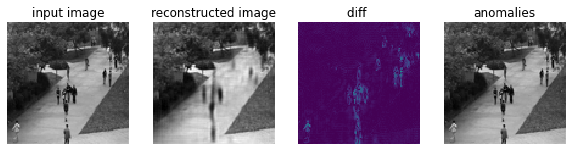

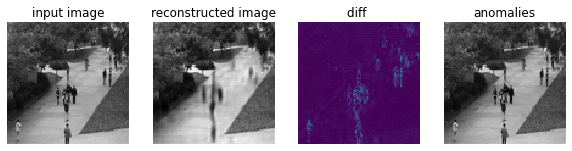

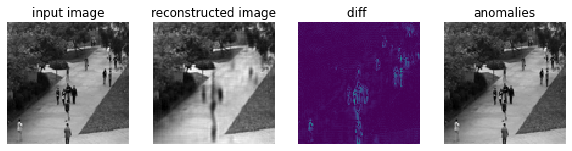

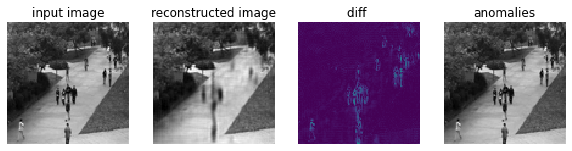

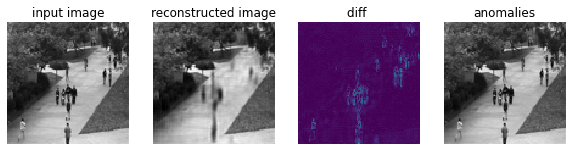

...

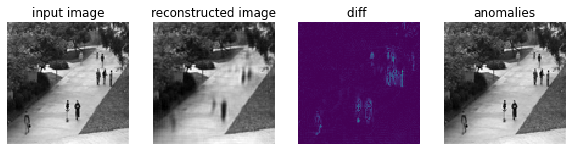

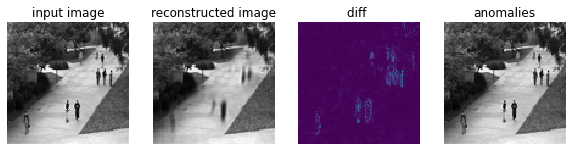

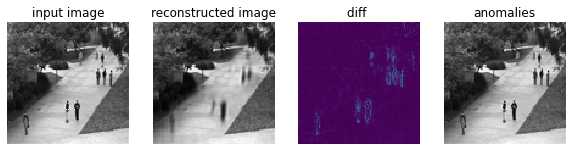

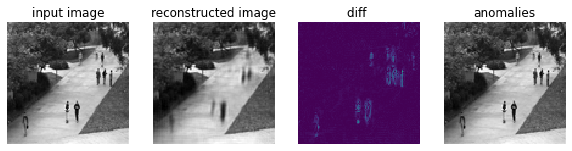

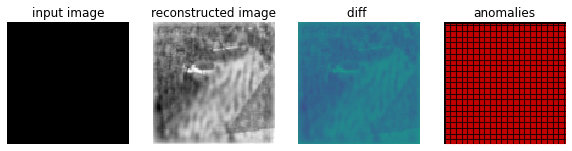

In [ ]:
def model_evaluation(model,dataloader):
  loss_l2_per_frame = []
  threshold = 4*255
  counter = 0
  test_loss_metric = gluon.loss.SigmoidBCELoss()
  loss_per_frame = 0
  im_list = []
  i = 0
  for image in dataloader:
    counter = counter + 1
    img = image[:,0,:,:].reshape(1,1,image.shape[-2],image.shape[-1])
    mask = image[:,1,:,:].as_in_context(mx.gpu())
    img = img.as_in_context(mx.gpu())
    output = model(img)
    output = output.transpose((0,2,3,1))
    img = img.transpose((0,2,3,1))
    output = output.asnumpy()*255
    img = img.asnumpy()*255
    diff = np.abs(output-img) 
    tmp = diff[0,:,:,0]
    H = signal.convolve2d(tmp, np.ones((4,4)), mode='same')
    H_new = mx.nd.array(np.where(H>threshold,1,0).reshape((1,100,100)),ctx=gpu())
    loss = test_loss_metric(H_new, mask)
    loss_l2_per_frame.append(loss.asscalar())
    plot_anomaly(img[0,:,:,0], output[0,:,:,0], diff[0,:,:,0], H, threshold, counter,UCSD_FOLDER)

  print("Total loss per frame for anomalies predicted = ",sum(loss_l2_per_frame)/len(dataloader))

## Evaluating the model using the anomaly predictions and regularity scores
model_evaluation(model,dataloader)

In [ ]:
import cv2
out_im = sorted(glob.glob(UCSD_FOLDER+ '/images/*.png'))

img_array = []
for filename in out_im:
    img = cv2.imread(filename)
    height, width, layers = img.shape
    #size = (width,height)
    img_array.append(img)

size = (360, 720)
_name = UCSD_FOLDER+'/vid' + '.mp4'
# self._cap = VideoCapture(0)
fourcc = cv2.VideoWriter_fourcc(*'MP4V')
out_vid = cv2.VideoWriter(_name,fourcc,15,size)

for i in range(0,199):
  out_vid.write(img_array[i])

out_vid.release()

In [ ]:
#2.1 training phase

files = sorted(glob.glob(UCSD_FOLDER+'/content/gdrive/MyDrive/UCSD_Anomaly_Dataset.v1p2/UCSDped1/Train/Train001'))
train_images = np.zeros((int(len(files)/200), 200, 227, 227))
i = 0
idx = 0
for filename in range(0, len(files)):
    im = Image.open(files[filename])
    im = im.resize((100,100))
    a[idx,i,:,:] = np.array(im, dtype=np.float32)/255.0
    i = i + 1
    if i >= 200:
      idx = idx + 1
      i = 0
np.save(UCSD_FOLDER + '/stacked_cae.npy',train_images)

In [ ]:
class convSTAE(gluon.nn.HybridBlock):
    def __init__(self):
        super(convSTAE, self).__init__()
        with self.name_scope():
            self.encoder = gluon.nn.HybridSequential(prefix="encoder")
            with self.encoder.name_scope():
                self.encoder.add(gluon.nn.Conv2D(512, kernel_size=15, strides=4, activation='relu'))
                self.encoder.add(gluon.nn.BatchNorm())
                self.encoder.add(gluon.nn.MaxPool2D(2))
                self.encoder.add(gluon.nn.BatchNorm())
                self.encoder.add(gluon.nn.Conv2D(256, kernel_size=4, activation='relu'))
                self.encoder.add(gluon.nn.BatchNorm())
                self.encoder.add(gluon.nn.MaxPool2D(2))
                self.encoder.add(gluon.nn.BatchNorm())
                self.encoder.add(gluon.nn.Conv2D(128, kernel_size=3, activation='relu'))
                self.encoder.add(gluon.nn.BatchNorm())
                
            self.decoder = gluon.nn.HybridSequential(prefix="decoder")
            with self.decoder.name_scope():
                self.decoder.add(gluon.nn.Conv2DTranspose(channels=256, kernel_size=3, activation='relu'))
                self.decoder.add(gluon.nn.BatchNorm())
                self.decoder.add(gluon.nn.HybridLambda(lambda F, x: F.UpSampling(x, scale=2, sample_type='nearest')))
                self.decoder.add(gluon.nn.BatchNorm())
                self.decoder.add(gluon.nn.Conv2DTranspose(channels=512, kernel_size=4, activation='relu'))
                self.decoder.add(gluon.nn.BatchNorm())
                self.decoder.add(gluon.nn.HybridLambda(lambda F, x: F.UpSampling(x, scale=2, sample_type='nearest')))
                self.decoder.add(gluon.nn.BatchNorm())
                self.decoder.add(gluon.nn.Conv2DTranspose(channels=10, kernel_size=15, strides=4, activation='sigmoid'))


    def hybrid_forward(self, F, x):
        x = self.encoder(x)
        x = self.decoder(x)

        return x

In [ ]:
ctx = gpu()
im_train = np.load(UCSD_FOLDER + '/stacked_cae.npy')
batch_size=32
dataset = gluon.data.ArrayDataset(mx.nd.array(im_train, dtype=np.float32))
dataloader = gluon.data.DataLoader(dataset, batch_size=batch_size, last_batch='rollover',shuffle=True)
num_epochs = 50
model = convSTAE()
model.hybridize()
model.collect_params().initialize(mx.init.Xavier('gaussian'), ctx=ctx)
loss_function = gluon.loss.L2Loss()
optimizer = gluon.Trainer(model.collect_params(), 'adam', {'learning_rate': 1e-4, 'wd': 1e-5})

In [ ]:
## Training Loop ##
loss_train_stacked=[]
for epoch in range(num_epochs): 
    for image_batch in dataloader:
        image = image_batch.as_in_context(ctx)
        with mx.autograd.record():
            output = model(image)
            loss = loss_function(output, image)
        loss.backward()
        optimizer.step(image.shape[0])
    loss_train_stacked.append(mx.nd.mean(loss).asscalar())
    print('epoch [{}/{}], loss:{:.4f}'.format(epoch + 1, num_epochs, mx.nd.mean(loss).asscalar()))
## Saving model params ##
model.save_parameters(UCSD_FOLDER+ "/autoencoder_stacked_ucsd.params")

epoch [1/50], loss:0.0004
epoch [2/50], loss:0.0004
epoch [3/50], loss:0.0004
epoch [4/50], loss:0.0004
epoch [5/50], loss:0.0004
epoch [6/50], loss:0.0004
epoch [7/50], loss:0.0004
epoch [8/50], loss:0.0004
epoch [9/50], loss:0.0004
epoch [10/50], loss:0.0004
epoch [11/50], loss:0.0004
epoch [12/50], loss:0.0004
epoch [13/50], loss:0.0004
epoch [14/50], loss:0.0004
epoch [15/50], loss:0.0004
epoch [16/50], loss:0.0004
epoch [17/50], loss:0.0004
epoch [18/50], loss:0.0004
epoch [19/50], loss:0.0004
epoch [20/50], loss:0.0004
epoch [21/50], loss:0.0004
epoch [22/50], loss:0.0004
epoch [23/50], loss:0.0004
epoch [24/50], loss:0.0004
epoch [25/50], loss:0.0004
epoch [26/50], loss:0.0004
epoch [27/50], loss:0.0004
epoch [28/50], loss:0.0004
epoch [29/50], loss:0.0004
epoch [30/50], loss:0.0004
epoch [31/50], loss:0.0004
epoch [32/50], loss:0.0004
epoch [33/50], loss:0.0004
epoch [34/50], loss:0.0004
epoch [35/50], loss:0.0004
epoch [36/50], loss:0.0004
epoch [37/50], loss:0.0004
epoch [38/

RuntimeError: ignored

In [ ]:
## Saving model params ##
model.save_parameters(UCSD_FOLDER+ "/autoencoder_stacked_ucsd.params")


RuntimeError: ignored

In [ ]:
np.save(UCSD_FOLDER+'/loss_train_stacked.npy',loss_train_stacked)

In [ ]:
"""**2.2 Testing Phase:**"""

model =  convSTAE()
model.load_parameters(UCSD_FOLDER +'/autoencoder_stacked_ucsd.params',ctx=ctx)
batch_size= 1
n=10 
test_file = sorted(glob.glob(UCSD_FOLDER+ '/UCSDped1/Test/Test024/*'))
test_file_gt = sorted(glob.glob(UCSD_FOLDER+'/UCSDped1/Test/Test024_gt/*'))
a = np.zeros((int(len(test_file)/n), n, 227, 227))
i = 0
idx = 0
for filename in range(0, len(test_file)):
    im = Image.open(test_file[filename])
    im = im.resize((227,227))
    a[idx,i,:,:] = np.array(im, dtype=np.float32)/255.0
    i = i + 1
    if i >= n:
      idx = idx + 1
      i = 0

b = np.zeros((int(len(test_file_gt)/n), n, 227, 227))
i = 0
idx = 0

for filename in range(0, len(test_file_gt)):
    im = Image.open(test_file_gt[filename])
    im = im.resize((227,227))
    b[idx,i,:,:] = np.array(im, dtype=np.float32)/255.0
    i = i + 1
    if i >= n:
      idx = idx + 1
      i = 0
## Test-time dataloaders for true images and their anomaly masks ##
dataset = gluon.data.ArrayDataset(mx.nd.array(a,ctx= ctx,dtype=np.float32))
dataloader = gluon.data.DataLoader(dataset, batch_size=1)
test_dataset = gluon.data.ArrayDataset(mx.nd.array(b,ctx= ctx, dtype=np.float32))
test_dataloader = gluon.data.DataLoader(dataset, batch_size=1)


MXNetError: ignored

In [ ]:
def plot_anomaly(img, output, diff, H, threshold, counter,UCSD_FOLDER):
  
    fig, (ax0, ax1, ax2,ax3) = plt.subplots(ncols=4, figsize=(10, 5))
    ax0.set_axis_off()
    ax1.set_axis_off()
    ax2.set_axis_off()
    
    ax0.set_title('input image')
    ax1.set_title('reconstructed image')
    ax2.set_title('diff ')
    ax3.set_title('anomalies')
    ax0.imshow(img, cmap=plt.cm.gray, interpolation='nearest') 
    ax1.imshow(output, cmap=plt.cm.gray, interpolation='nearest')   
    ax2.imshow(diff, cmap=plt.cm.viridis, vmin=0, vmax=255, interpolation='nearest')  
    ax3.imshow(img, cmap=plt.cm.gray, interpolation='nearest')
    x,y = np.where(H > threshold)
    ax3.scatter(y,x,color='red',s=0.1) 
    plt.axis('off')   
    fig.savefig('/content/gdrive/My Drive/UCSD_Anomaly_Dataset.v1p2/images_stacked_cae/' + str(counter) + '.png')

In [ ]:
def loss_compute(output,image_gt,image,UCSD_FOLDER,counter):
  loss_l2_per_frame = []
  test_loss_metric = gluon.loss.SigmoidBCELoss(from_sigmoid=False)
  # there will be 10 chnannels rep each image flatten them out
  output = output.asnumpy().squeeze()*255
  image_gt= image_gt.asnumpy().squeeze()
  image= image.asnumpy().squeeze()*255
  threshold = 4*255
  for i in range(0,10):
    counter+=1
    im_out = output[i,:,:]
    im = image[i,:,:]
    diff = np.abs(im_out-im)
    H = signal.convolve2d(diff, np.ones((4,4)), mode='same')
    H_new = mx.nd.array(np.where(H>threshold,1,0).reshape((1,227,227)),ctx=gpu())
    mask =  mx.nd.array(image_gt[i,:,:].reshape((1,227,227)),ctx=gpu())
    loss_l2_per_frame.append(test_loss_metric(H_new,mask).asscalar())
    plot_anomaly(im, im_out,diff, H, threshold, counter,UCSD_FOLDER)
  return loss_l2_per_frame

def model_evaluation(model,dataloader,test_dataloader,UCSD_FOLDER):
  loss = []
  im_list = []
  counter = 0
  for image,image_gt in zip(dataloader,test_dataloader):
    output = model(image)
    l = loss_compute(output,image_gt,image,UCSD_FOLDER,counter)
    counter+=10
    loss.extend(l)
  print("Total loss per frame for anomalies predicted = ",sum(loss)/len(loss))

model_evaluation(model,dataloader,test_dataloader,UCSD_FOLDER)

NameError: ignored

In [ ]:
def model_evaluation(model,dataloader,test_dataloader,UCSD_FOLDER):
  loss = []
  im_list = []
  counter = 0
  for image,image_gt in zip(dataloader,test_dataloader):
    output = model(image)
    l = loss_compute(output,image_gt,image,UCSD_FOLDER,counter)
    counter+=10
    loss.extend(l)
  print("Total loss per frame for anomalies predicted = ",sum(loss)/len(loss))
## Call statement  for evaluation ##
model_evaluation(model,dataloader,test_dataloader,UCSD_FOLDER)

NameError: ignored

In [ ]:
import cv2
images = sorted(glob.glob(UCSD_FOLDER+'/images_stacked_cae/*.png'))
img_array = []
for filename in images:
    img = cv2.imread(filename)
    height, width, layers = img.shape
    img_array.append(img)
file_name = UCSD_FOLDER+'/vid_cae.avi'
fourcc = cv2.VideoWriter_fourcc(*'XVID')
size = (1024,720)
out_vid = cv2.VideoWriter(file_name,fourcc,1,size,3)
for i in range(0,199):
  frame = cv2.resize(img_array[i],size)
  out_vid.write(frame)
out_vid.release()

IndexError: ignored